In [25]:
import argparse
import math
import os
import time
from typing import Tuple

import imageio
import nerfview
import numpy as np
import torch
import torch.nn.functional as F
import tqdm
import viser
import cv2
import matplotlib.pyplot as plt
from scipy.spatial import ConvexHull
import open3d as o3d
from scipy.spatial import KDTree
import networkx as nx

from gsplat._helper import load_test_data
from gsplat.distributed import cli
from gsplat.rendering import rasterization


In [2]:
torch.manual_seed(42)
device = torch.device("cuda", 0)

## LOAD DATA

In [3]:
pcd = o3d.io.read_point_cloud('./outputs/parcours3/070520251307/ply/point_cloud_149999_converted.ply')

In [4]:
means, quats, scales, opacities, sh0, shN = [], [], [], [], [], []
ckpt_path = './outputs/parcours3/070520251307/ckpts/ckpt_149999_rank0.pt'
ckpt = torch.load(ckpt_path, map_location=device)["splats"]
means.append(ckpt["means"])
quats.append(F.normalize(ckpt["quats"], p=2, dim=-1))
scales.append(torch.exp(ckpt["scales"]))
opacities.append(torch.sigmoid(ckpt["opacities"]))
sh0.append(ckpt["sh0"])
shN.append(ckpt["shN"])
means = torch.cat(means, dim=0)
quats = torch.cat(quats, dim=0)
scales = torch.cat(scales, dim=0)
opacities = torch.cat(opacities, dim=0)
sh0 = torch.cat(sh0, dim=0)
shN = torch.cat(shN, dim=0)
colors = torch.cat([sh0, shN], dim=-2)
sh_degree = int(math.sqrt(colors.shape[-2]) - 1)

/tmp/ipykernel_70/1134690980.py:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(ckpt_path, map_location=device)["splats"]


## Preprocess Point Cloud

In [5]:
'''# Crop field
center = np.array([-0.18286747, 0.03789186, 0.05519086])
extent = np.array([4.03829098, 3.77028084, 0.61684835])
# Calculate min_bound and max_bound
min_bound = center - extent / 2  # Subtract half extent to get min bound
max_bound = center + extent / 2  # Add half extent to get max bound
bbox = o3d.geometry.AxisAlignedBoundingBox(min_bound=min_bound, max_bound=max_bound)
field_pcd = pcd.crop(bbox)'''

'# Crop field\ncenter = np.array([-0.18286747, 0.03789186, 0.05519086])\nextent = np.array([4.03829098, 3.77028084, 0.61684835])\n# Calculate min_bound and max_bound\nmin_bound = center - extent / 2  # Subtract half extent to get min bound\nmax_bound = center + extent / 2  # Add half extent to get max bound\nbbox = o3d.geometry.AxisAlignedBoundingBox(min_bound=min_bound, max_bound=max_bound)\nfield_pcd = pcd.crop(bbox)'

In [6]:
pcd_center = pcd.get_center()
nn = 50
std_multiplier = 1
filtered_pcd = pcd.remove_statistical_outlier(nn, std_multiplier)
filtered_pcd = filtered_pcd[0]

In [7]:
def remove_floor_plane_from_point_cloud(pcd, distance_threshold=0.02, ransac_n=3, num_iterations=1000):
    # Segment the largest plane in the point cloud using RANSAC
    plane_model, inliers = pcd.segment_plane(distance_threshold=distance_threshold, 
                                             ransac_n=ransac_n, 
                                             num_iterations=num_iterations)
    
    # Extract the points that do not belong to the floor (plane)
    inlier_cloud = pcd.select_by_index(inliers)
    outlier_cloud = pcd.select_by_index(inliers, invert=True)
    
    # Optionally, visualize the result (the floor points and the remaining points)
    print(f"Detected plane: {plane_model}")
    print(f"Number of points in floor plane: {len(inliers)}")
    print(f"Number of points remaining (without floor plane): {len(outlier_cloud.points)}")

    # You can visualize the point clouds if you want
    # inlier_cloud.paint_uniform_color([1, 0, 0])  # Red for floor plane
    # outlier_cloud.paint_uniform_color([0, 1, 0])  # Green for remaining points
    # o3d.visualization.draw_geometries([inlier_cloud, outlier_cloud])
    
    return outlier_cloud

# Remove the floor plane
cleaned_pcd = remove_floor_plane_from_point_cloud(filtered_pcd)

Detected plane: [-0.01443099  0.00750326  0.99986772 -0.00731001]
Number of points in floor plane: 181806
Number of points remaining (without floor plane): 319442


In [8]:
pcd_center = cleaned_pcd.get_center()
nn = 50
std_multiplier = 1
filtered_pcd = cleaned_pcd.remove_statistical_outlier(nn, std_multiplier)
cleaned_pcd = filtered_pcd[0]
filtered_pcd = cleaned_pcd

## Extract Clusters

In [9]:
def build_radius_graph(points, radius, max_neighbours=None):
    """
    Build a graph by connecting points within a specified radius using KD-tree
    """
    
    # Convert points to numpy array if not already
    points = np.asarray(points)
    
    # Create KD-tree
    kdtree = KDTree(points)
    
    # Initialize graph
    graph = nx.Graph()
    
    # Add nodes with position attributes
    for i in range(len(points)):
        graph.add_node(i, pos=points[i])
    
    # Query the KD-tree for all points within radius
    pairs = kdtree.query_pairs(radius)
    
    for i, j in pairs:
        dist = np.linalg.norm(points[i] - points[j])
        graph.add_edge(i, j, weight=dist)
        
    # If max_neighbours is specified, prune the graph
    if max_neighbours is not None:
        prune_to_k_neighbours(graph, max_neighbours)
        
    return graph

def prune_to_k_neighbours(graph, k):
    """
    Prune the graph to keep only the k nearest neighbours for each node
    """
    
    for node in graph.nodes():
        edges = [(node, neighbour, graph[node][neighbour]['weight'])
                 for neighbour in graph[node]]
        if len(edges) > k:
            # Sort edges by weight
            edges.sort(key=lambda x: x[2])
            # Remove edges beyond k nearest
            edges_to_remove = edges[k:]
            graph.remove_edges_from([(e[0], e[1]) for e in edges_to_remove])
            
            
def get_connected_components(graph):
    """
    Extract connected components from the graph
    """ 
    
    components = list(nx.connected_components(graph))
    return [graph.subgraph(component).copy() for component in components]

def analyze_components(graph):
    """
    Analuze properties of connected components
    """
    
    components = list(nx.connected_components(graph))
    
    analysis = {
        'num_components': len(components),
        'largest_component_size': max(len(c) for c in components),
        'smallest_component_size': min(len(c) for c in components),
        'avg_component_size': np.mean([len(c) for c in components]),
        'isolated_points': sum(1 for c in components if len(c) == 1),
        'num_good_components': sum(1 for c in components if len(c) > 1000)  
    }
    
    return analysis

def plot_cc_o3d(graph, points, cmap='tab20'):
    """
    Plot connected components with different colors
    """
    
    # Get connected components
    components = list(nx.connected_components(graph))
    n_components = len(components)
    
    # Create color iterator
    colors = plt.colormaps[cmap](np.linspace(0, 1, max(5000, 1)))
    colors = np.vstack([colors, colors, colors, colors, colors, colors, colors, colors])
    rgb_cluster = np.zeros(np.shape(points))
    
    # Plot each component with different color
    for idx, component in enumerate(components):
        if len(component) <= 1000:
            rgb_cluster[list(component)] = [0, 0, 0]
            idx -= 1
        else:
            color = colors[idx][:3]
            rgb_cluster[list(component)] = color
            
    pcd_clusters = o3d.geometry.PointCloud()
    pcd_clusters.points = o3d.utility.Vector3dVector(points)
    pcd_clusters.colors = o3d.utility.Vector3dVector(rgb_cluster)
    
    return pcd_clusters

def create_clusters(graph, points):
    """
    Extract clusters from connected components
    """
    
    # Get connected components
    components = list(nx.connected_components(graph))
    n_components = len(components)
    
    # Create clusters list
    clusters = []
    
    # Extract components into a list
    for idx, component in enumerate(components):
        if len(component) <= 1000:
            # Skip small clusters (probably noise)
            pass
        else:
            # Turn connected components into point clouds
            cluster = o3d.geometry.PointCloud()
            cluster.points = o3d.utility.Vector3dVector(points[list(component)])
            clusters.append(cluster)
            
    
    return clusters

In [10]:
# Get point cloud coordinates
xyz = np.asarray(filtered_pcd.points)
nn_d = np.mean(filtered_pcd.compute_nearest_neighbor_distance()[0])

# Build the graph
graph = build_radius_graph(xyz, radius=nn_d*7)

# Analyze components
component_analysis = analyze_components(graph)
print("\nComponent Analysis:")
for metric, value in component_analysis.items():
    print((f"{metric}: {value}"))



Component Analysis:
num_components: 175
largest_component_size: 60279
smallest_component_size: 1
avg_component_size: 1558.9657142857143
isolated_points: 8
num_good_components: 27


In [11]:
clusters = create_clusters(graph, xyz)

In [12]:
def make_rotation_matrix_xy_parallel(R):
    # Original X axis
    x_axis = R[:, 0]
    # Project X onto XY plane
    x_proj = np.array([x_axis[0], x_axis[1], 0])
    if np.linalg.norm(x_proj) < 1e-8:
        # If X is vertical, use Y axis instead
        y_axis = R[:, 1]
        x_proj = np.array([y_axis[0], y_axis[1], 0])
    x_proj /= np.linalg.norm(x_proj)
    
    # New Z axis
    z_axis = np.array([0, 0, 1])
    # New Y axis
    y_axis = np.cross(z_axis, x_proj)
    y_axis /= np.linalg.norm(y_axis)
    
    # Re-orthogonalize X (in case of numerical issues)
    x_axis = np.cross(y_axis, z_axis)
    x_axis /= np.linalg.norm(x_axis)
    
    # Build new rotation matrix
    R_new = np.column_stack((x_axis, y_axis, z_axis))
    return R_new

# Function to create a bounding box around a point cloud
def create_bounding_box(point_cloud):
    # Get the oriented bounding box of the point cloud
    aabb = point_cloud.get_oriented_bounding_box()
    
    # Get the center, extent (width, height, depth) and rotation matrix of the bounding box
    center = aabb.center
    extent = aabb.extent  # This returns [width, height, depth]
    rotation = np.copy(aabb.R)

    # Make rotation matrix parallel to xy plane
    rotation = make_rotation_matrix_xy_parallel(rotation)
    
    # Define the oriented bounding box (optional: use it if you want rotation)
    # If you want an axis-aligned bounding box, you can just return the aabb.
    bbox = o3d.geometry.OrientedBoundingBox(center, rotation, extent)
    
    return bbox


def lookat_to_matrix(eye, lookat, up):
    """Compute the transformation matrix from camera position (eye) and lookat."""
    # Compute the forward, right, and up directions
    forward = (lookat - eye)
    forward /= np.linalg.norm(forward)
    
    right = np.cross(up, forward)
    right /= np.linalg.norm(right)
    
    up = np.cross(forward, right)
    up /= np.linalg.norm(up)
    
    # Create the rotation matrix (3x3)
    rotation_matrix = np.column_stack([right, up, forward])  # Negative forward to point the camera inwards
    
    # Create the translation vector (3x1)
    translation = eye
    
    # Create the 4x4 transformation matrix
    transformation_matrix = np.eye(4)
    transformation_matrix[:3, :3] = rotation_matrix
    transformation_matrix[:3, 3] =  translation
    
    return transformation_matrix

# Function to set camera view to a specific face of the bounding box
def set_camera_view_from_face(bbox, face_id):
    # Get the center and extents of the bounding box
    center = bbox.center
    extents = bbox.extent / 2  # Half-extents (radius from center)
    rotation = bbox.R # Rotation matrix for camera rotation (this is to offset the bbox rotation wrt. world coordinates)
    
    # Define camera positions for each of the 6 faces of the bounding box
    if face_id == 0:  # Front face (viewing inward)
        eye = center + np.dot(rotation, np.array([0, extents[1] + 0.2, extents[2] + 0.2]))  # Place camera just outside the front face
        lookat = center
        up = np.array([0, 0, -1])
    elif face_id == 1:  # Back face (viewing inward)
        eye = center - np.dot(rotation, np.array([0, extents[1] + 0.2, - (extents[2] + 0.2)]))  # Place camera just outside the back face
        lookat = center
        up = np.array([0, 0, -1])
    elif face_id == 2:  # Top face (viewing inward)
        eye = center + np.dot(rotation, np.array([0, extents[1] + 0.2, 0.0]))  # Place camera just outside the top face
        lookat = center
        up = np.array([0, 0, -1])
    elif face_id == 3:  # Bottom face (viewing inward)
        eye = center - np.dot(rotation, np.array([0, extents[1] + 0.2, 0.0]))  # Place camera just outside the bottom face
        lookat = center
        up = np.array([0, 0, -1])
    elif face_id == 4:  # Left face (viewing inward)
        eye = center + np.dot(rotation, np.array([extents[0] + 0.2, 0, 0.0]))  # Place camera just outside the left face
        lookat = center
        up = np.array([0, 0, -1])
    elif face_id == 5:  # Right face (viewing inward)
        eye = center - np.dot(rotation, np.array([extents[0] + 0.2, 0, 0.0]))  # Place camera just outside the right face
        lookat = center
        up = np.array([0, 0, -1])
    elif face_id == 6:  
        eye = center + np.dot(rotation, np.array([extents[0] + 0.2, extents[1] + 0.2, 0.0])) # Place camera just outside the right face
        lookat = center
        up = np.array([0, 0, -1])
    elif face_id == 7:  
        eye = center - np.dot(rotation, np.array([extents[0] + 0.2, extents[1] + 0.2, 0.0]))  # Place camera just outside the right face
        lookat = center
        up = np.array([0, 0, -1])
    elif face_id == 8:  
        eye = center + np.dot(rotation, np.array([0, extents[1], 0.0]))  # Place camera just outside the top face
        lookat = center
        up = np.array([0, 0, -1])
    
    
    return np.array(lookat_to_matrix(eye, lookat, up))

In [13]:
# Initialize the image dimensions
img_wh = (800, 600)  # Width = 800 pixels, Height = 600 pixels

width, height = img_wh
# Initialize camera state object (assuming a CameraState class exists)
class CameraState:
    def __init__(self):
        # Initialize some arbitrary values for camera matrix and world-to-camera matrix
        self.c2w = np.array([[1., 0., 0., 0.],
 [0., 1., 0., -0. ],
 [0. , 0., 1., 0.],
 [ 0.,  0., 0., 1.]])

        
    def get_K(self, img_wh):
        # Assume a simple camera intrinsic matrix for demonstration
        f = 500  # Focal length
        cx, cy = img_wh[0] / 2, img_wh[1] / 2  # Principal point at the center
        return np.array([[f, 0, cx],
                [0, f, cy],
                [0, 0, 1]])  # 3x3 intrinsic matrix

# Initialize camera state object
camera_state = CameraState()

c2w = camera_state.c2w
K = camera_state.get_K(img_wh)
c2w = torch.from_numpy(c2w).float().to(device)
K = torch.from_numpy(K).float().to(device)
viewmat = c2w.inverse()

In [ ]:
for cluster_id in range(len(clusters)):
    
    # Define the bounding box dimensions (in the global coordinate system)
    bbox_width = 0.2  # Adjust as needed
    bbox_height = 0.2
    bbox_depth = 0.2
    
    # Create the bounding box around the cluster center
    #bounding_box = create_bounding_box(cluster_centers[cluster_id], bbox_width, bbox_height, bbox_depth) 

    bounding_box = create_bounding_box(clusters[cluster_id])

    # Create a figure for displaying the images
    fig, axes = plt.subplots(3, 3, figsize=(12, 8))
    axes = axes.flatten()  # Flatten the 2x3 grid to make indexing easier

    for face_id in range(9):
        transformation_matrix = set_camera_view_from_face(bounding_box, face_id)

        # Initialize camera state object
        camera_state = CameraState()

        c2w = transformation_matrix
        K = camera_state.get_K(img_wh)
        c2w = torch.from_numpy(c2w).float().to(device)
        K = torch.from_numpy(K).float().to(device)
        viewmat = c2w.inverse()

        render_colors, render_alphas, meta = rasterization(
            means,  # [N, 3]
            quats,  # [N, 4]
            scales,  # [N, 3]
            opacities,  # [N]
            colors,  # [N, S, 3]
            viewmat[None],  # [1, 4, 4]
            K[None],  # [1, 3, 3]
            width,
            height,
            sh_degree=sh_degree,
            render_mode="RGB",
            # this is to speedup large-scale rendering by skipping far-away Gaussians.
            radius_clip=3,
        )

        image = np.array((render_colors[0, :].detach().cpu().numpy()*255)).astype(np.uint8).astype(np.uint8)

        # Convert the image to a format suitable for matplotlib
        image_np = np.asarray(image)
        #cv2.imwrite(f'./renders/image_{cluster_id}{face_id}.jpg', cv2.cvtColor(image_np, cv2.COLOR_RGB2BGR))
        # Display the image in the corresponding subplot
        axes[face_id].imshow(image_np)
        axes[face_id].axis('off')  # Turn off axis labels
        axes[face_id].set_title(f"Face {face_id}")


In [14]:
from rfdetr import RFDETRBase
from rfdetr.util.horse_classes import HORSE_CLASSES
import supervision as sv
from collections import Counter

In [15]:
model = RFDETRBase(pretrain_weights='./rf-detr/rfdetr/trained/190420250827/checkpoint_best_total.pth')

num_classes mismatch: pretrain weights has 8 classes, but your model has 90 classes
reinitializing detection head with 8 classes


Loading pretrain weights


In [16]:
def calculate_bbox_area(box):
    x_min, y_min, x_max, y_max = box
    width = max(0, x_max - x_min)
    height = max(0, y_max - y_min)
    return width * height

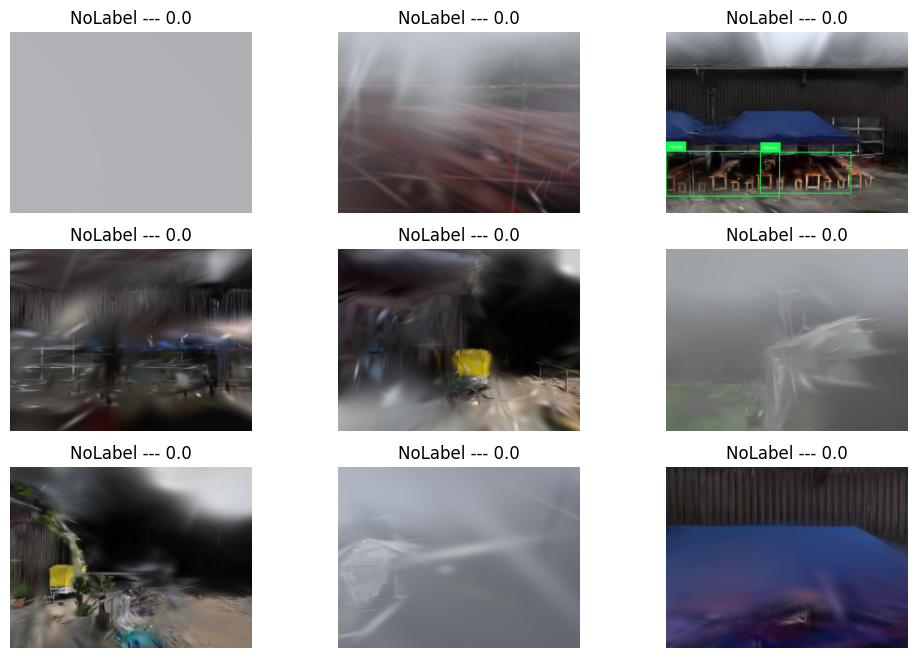

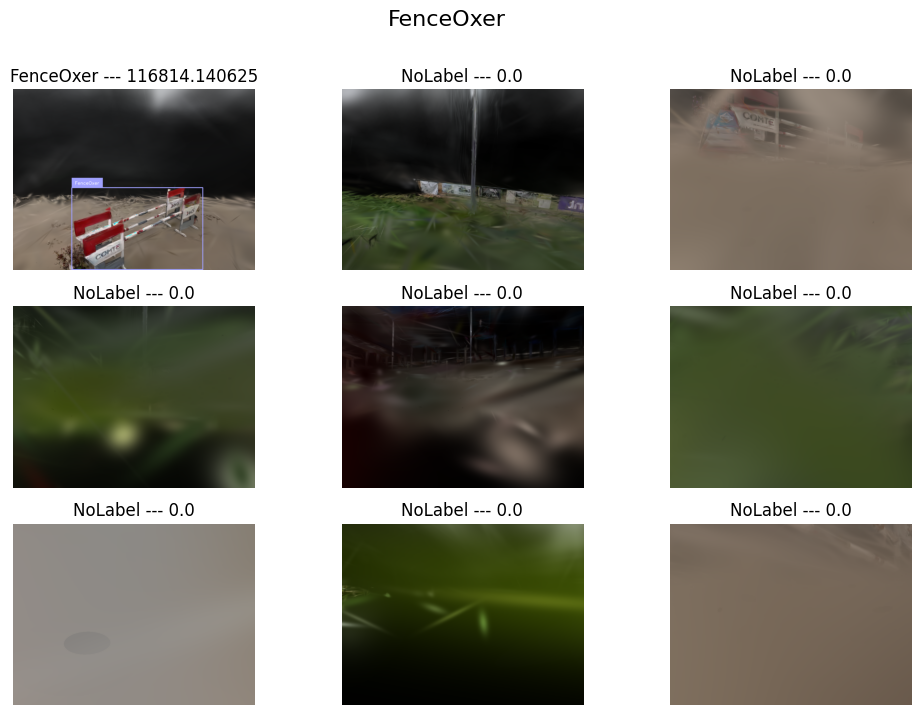

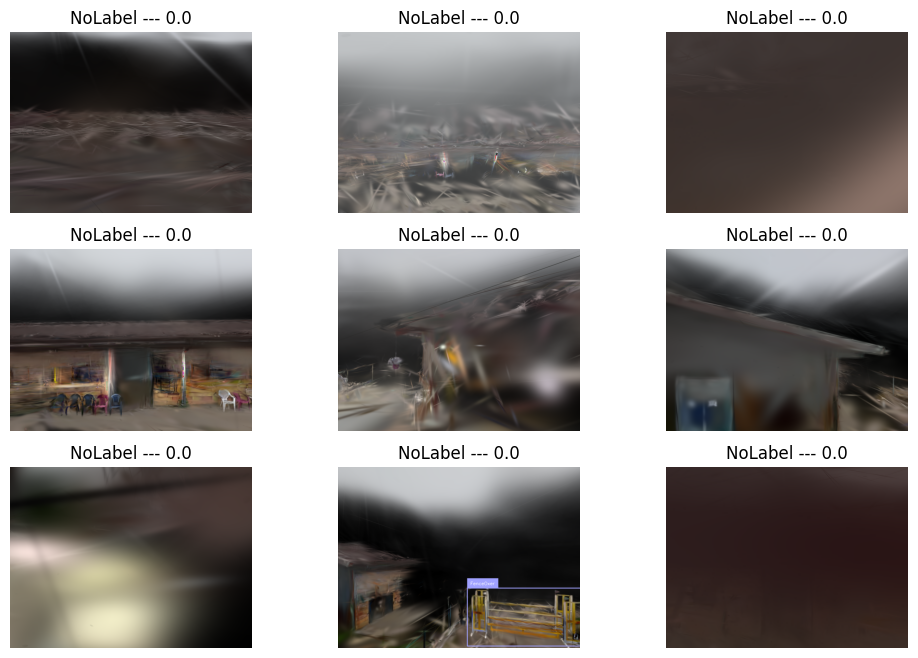

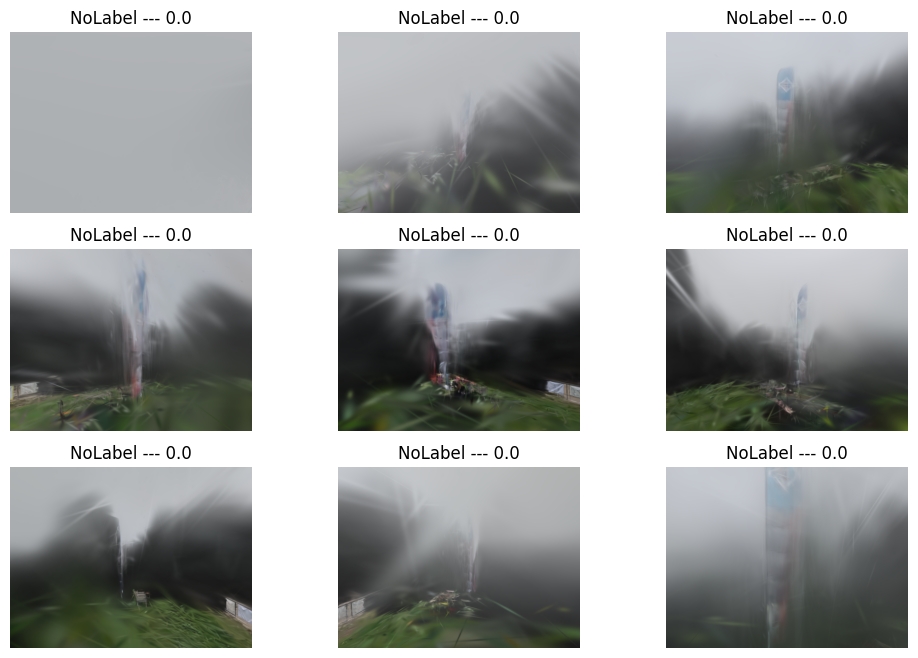

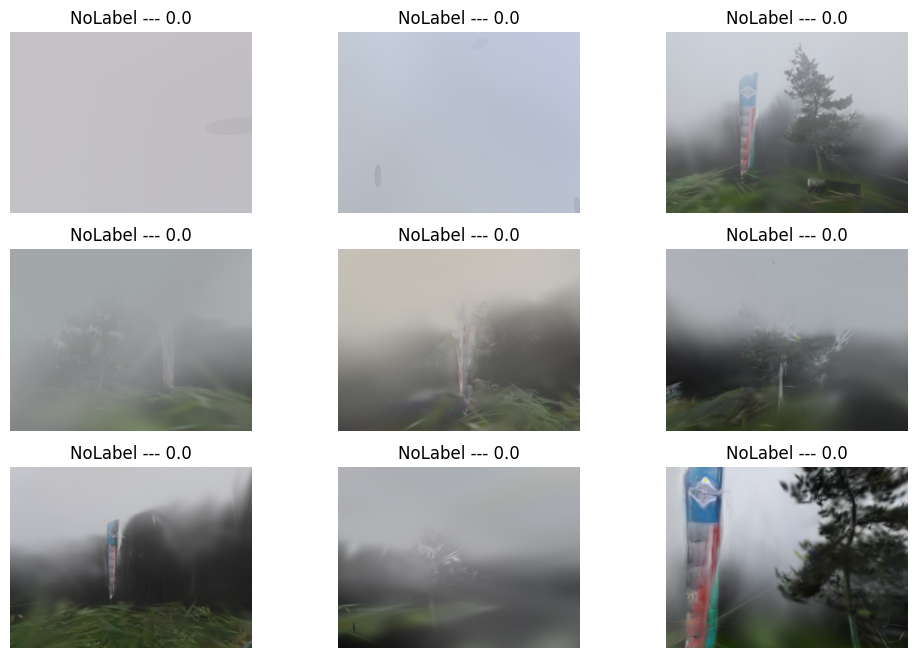

...

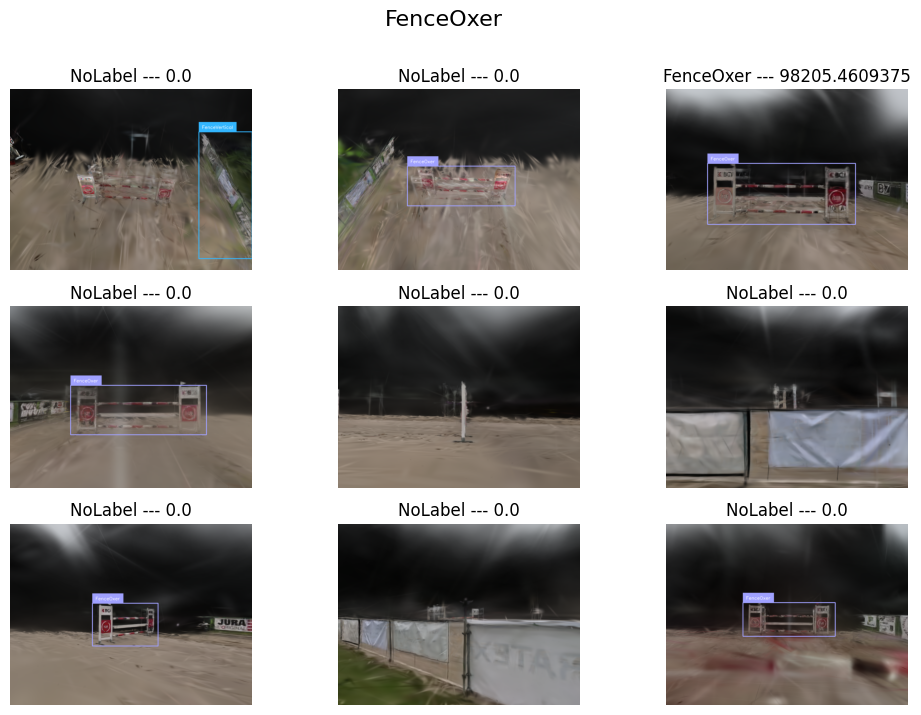

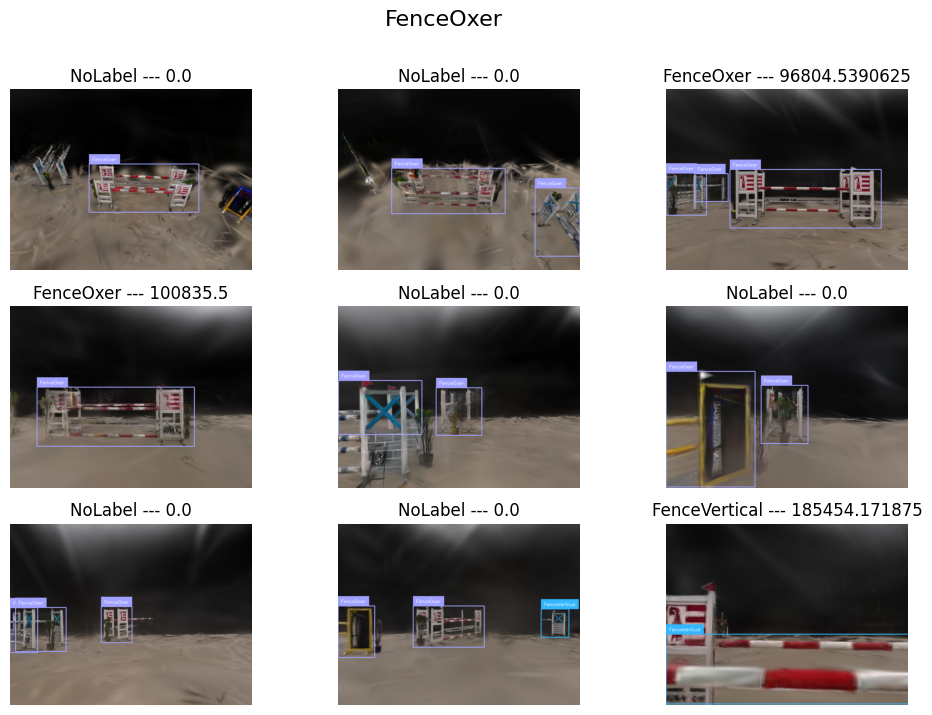

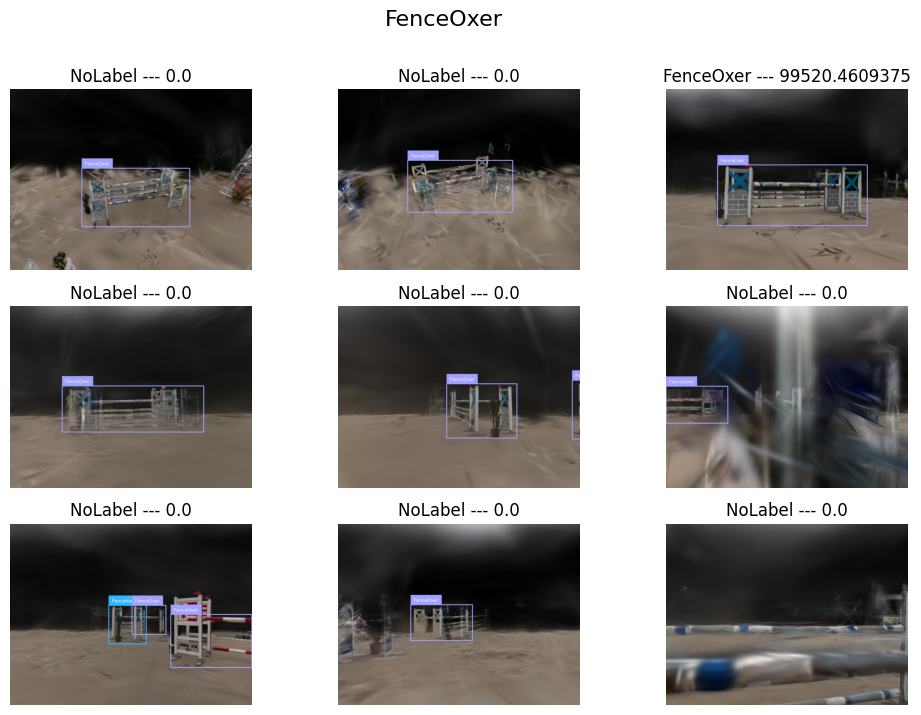

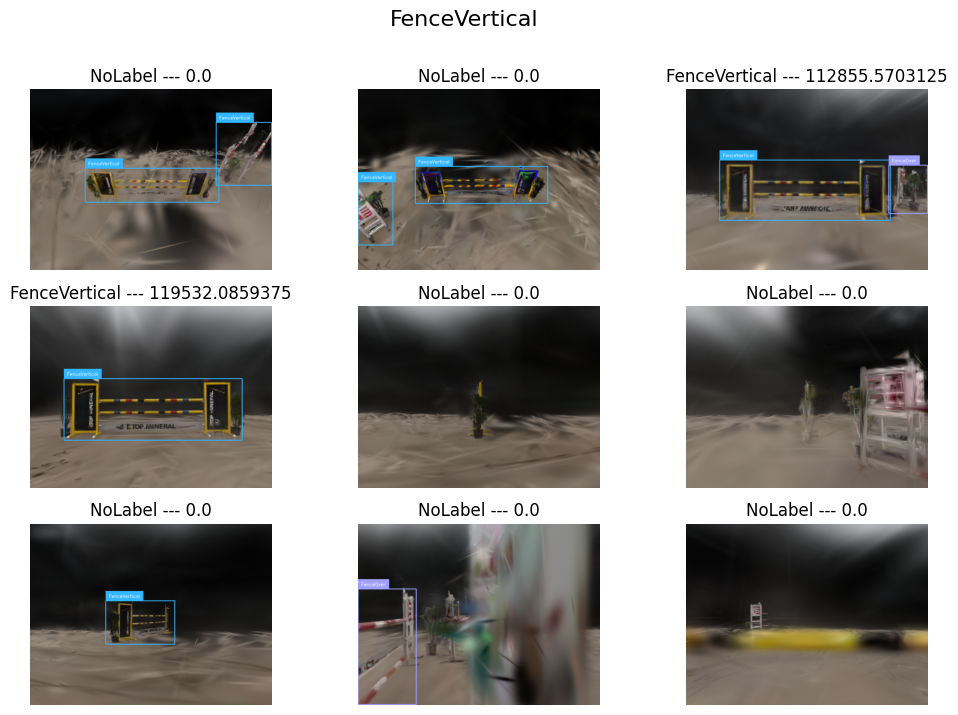

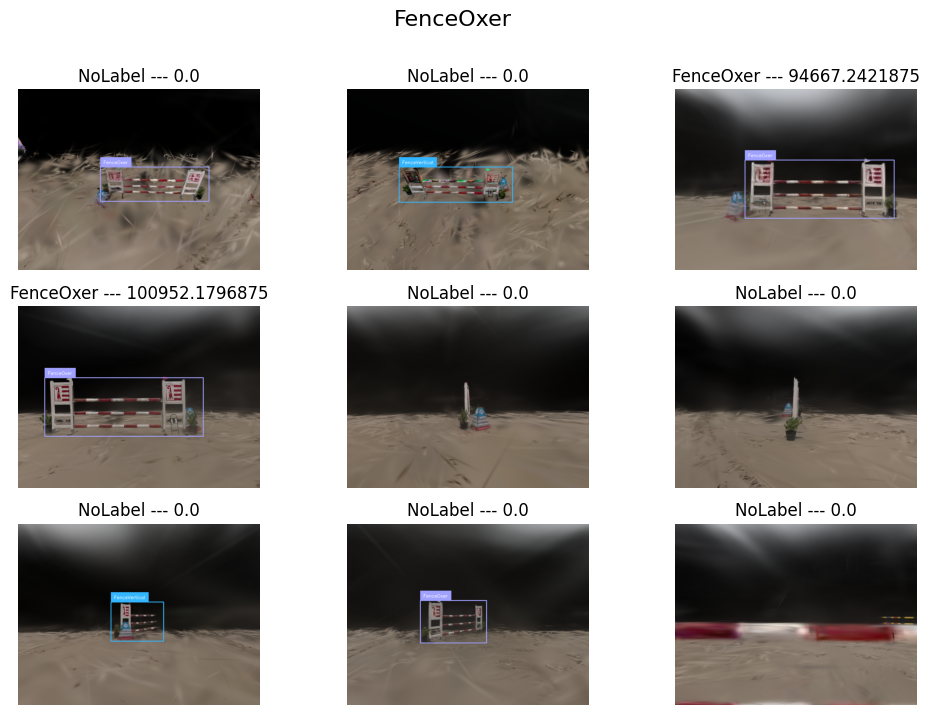

In [17]:
for cluster_id in range(len(clusters)):
    
    # Define the bounding box dimensions (in the global coordinate system)
    bbox_width = 0.2  # Adjust as needed
    bbox_height = 0.2
    bbox_depth = 0.2
    
    # Create the bounding box around the cluster center
    #bounding_box = create_bounding_box(cluster_centers[cluster_id], bbox_width, bbox_height, bbox_depth) 

    bounding_box = create_bounding_box(clusters[cluster_id])

    # Create a figure for displaying the images
    fig, axes = plt.subplots(3, 3, figsize=(12, 8))
    axes = axes.flatten()  # Flatten the 2x3 grid to make indexing easier
    
    labels_list =[]
    
    for face_id in range(9):
        transformation_matrix = set_camera_view_from_face(bounding_box, face_id)

        # Initialize camera state object
        camera_state = CameraState()

        c2w = transformation_matrix
        K = camera_state.get_K(img_wh)
        c2w = torch.from_numpy(c2w).float().to(device)
        K = torch.from_numpy(K).float().to(device)
        viewmat = c2w.inverse()

        render_colors, render_alphas, meta = rasterization(
            means,  # [N, 3]
            quats,  # [N, 4]
            scales,  # [N, 3]
            opacities,  # [N]
            colors,  # [N, S, 3]
            viewmat[None],  # [1, 4, 4]
            K[None],  # [1, 3, 3]
            width,
            height,
            sh_degree=sh_degree,
            render_mode="RGB",
            # this is to speedup large-scale rendering by skipping far-away Gaussians.
            radius_clip=5,
            far_plane=0.5
        )

        image = np.array((render_colors[0, :].detach().cpu().numpy()*255)).astype(np.uint8).astype(np.uint8)

        # Convert the image to a format suitable for matplotlib
        image_np = np.asarray(image)
        
        detections = model.predict(image, threshold=0.5)
        biggest_area = 0.0
        label = "NoLabel"
        
        for detection in detections:
        
            #print(detection)
            area = calculate_bbox_area(detection[0])
            
            if area > biggest_area and area > 70000 and detection[2] > 0.5:
                biggest_area = area
                label = HORSE_CLASSES[detection[3]]
        
        
        labels = [
           f"{HORSE_CLASSES[class_id]}"
            for class_id, confidence
            in zip(detections.class_id, detections.confidence)
        ]
        #label = labels[0] if len(labels) > 0 else "NoLabel"
        
        if label != "NoLabel":
            labels_list.append(label)
        #print(label)
        
        annotated_image = image.copy()
        annotated_image = sv.BoxAnnotator().annotate(annotated_image, detections)
        annotated_image = sv.LabelAnnotator().annotate(annotated_image, detections, labels)
        
        #cv2.imwrite(f'./renders/image_{cluster_id}{face_id}.jpg', cv2.cvtColor(image_np, cv2.COLOR_RGB2BGR))
        # Display the image in the corresponding subplot
        axes[face_id].imshow(annotated_image)
        axes[face_id].axis('off')  # Turn off axis labels
        axes[face_id].set_title(f"{label} --- {biggest_area}")
    
    if len(labels_list) > 0:
        cluster_class = Counter(labels_list).most_common(1)[0][0]
        #print(cluster_class)
        fig.suptitle(cluster_class, fontsize=16)
    

In [27]:
def create_2d_line_from_bbox(bounding_box):
    # Assuming you have your bounding box center and extent
        center = bounding_box.center
        extent = bounding_box.extent  
    
        # Find the longest extent and its direction
        longest_axis = np.argmax(extent)
        direction = np.zeros(3)
        direction[longest_axis] = 1.0
    
        # Rotate direction according to bounding box rotation matrix
        direction = np.dot(bounding_box.R, direction)
    
        # Calculate the start and end points of the line
        # We'll make the line length equal to the longest extent
        line_length = extent[longest_axis]
        start_point = center - (direction * line_length / 2)
        end_point = center + (direction * line_length / 2)
    
        # Create a line set
        points = np.array([start_point, end_point])
        lines = np.array([[0, 1]])  # Connect point 0 to point 1
        line_set = o3d.geometry.LineSet()
        line_set.points = o3d.utility.Vector3dVector(points)
        line_set.lines = o3d.utility.Vector2iVector(lines)

        return line_set
    

def plot_top_down_bboxes(bboxes, labels):
    plt.figure(figsize=(8, 8))
    ax = plt.gca()
    
    for idx, bbox in enumerate(bboxes):
        corners_3d = np.asarray(bbox.get_box_points())
        corners_2d = corners_3d[:, :2]

        # Compute the center of the box (projected)
        center_2d = bbox.center[:2]

        # Convex hull for plotting box outline
        hull = ConvexHull(corners_2d)
        hull_points = corners_2d[hull.vertices]
        hull_points = np.vstack([hull_points, hull_points[0]])

        # Draw the bounding box
        ax.plot(hull_points[:, 0], hull_points[:, 1], 'b-')
        
        # Compute orientation for text
        center_2d = bbox.center[:2]
        extent = bbox.extent  # 3D extents along bbox axes
        R = bbox.R  # 3x3 rotation matrix

        # Get direction of major axis (longest extent)
        major_axis_index = np.argmax(extent)
        major_axis_vector_3d = R[:, major_axis_index]
        major_axis_vector_2d = major_axis_vector_3d[:2]

        # Compute angle in degrees from the X-axis
        angle_rad = np.arctan2(major_axis_vector_2d[1], major_axis_vector_2d[0])
        angle_deg = np.degrees(angle_rad)
        
        
         # Draw the label if provided
        if labels and idx < len(labels):
            ax.text(center_2d[0], center_2d[1], labels[idx],
                    fontsize=10, color='black', ha='center', va='center', rotation=angle_deg,
                    bbox=dict(facecolor='white', alpha=0.6, boxstyle='round,pad=0.2'))
    
    ax.set_aspect('equal')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.title('Top-Down View of 3D Bounding Boxes')
    plt.grid(True)
    plt.show()
    
def plot_top_down_lines(linesets):
    plt.figure(figsize=(8, 8))
    ax = plt.gca()
    
    for lineset in linesets:
        # Get 3D points and line indices
        points = np.asarray(lineset.points)
        lines = np.asarray(lineset.lines)

        # Project points to 2D (drop Z axis)
        points_2d = points[:, :2]

        # Plot each line as a 2D segment
        for line in lines:
            pt1 = points_2d[line[0]]
            pt2 = points_2d[line[1]]
            ax.plot([pt1[0], pt2[0]], [pt1[1], pt2[1]], 'r-')
        
    
    ax.set_aspect('equal')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.title('Top-Down View of 3D Bounding Box lines')
    plt.grid(True)
    plt.show()

In [21]:
line_array = []
bbox_array = []
label_array = []

for cluster_id in range(len(clusters)):
    
    
    # Create the bounding box around the cluster center
    bounding_box = create_bounding_box(clusters[cluster_id])
    
    labels_list =[]
    
    for face_id in range(9):
        transformation_matrix = set_camera_view_from_face(bounding_box, face_id)

        # Initialize camera state object
        camera_state = CameraState()

        c2w = transformation_matrix
        K = camera_state.get_K(img_wh)
        c2w = torch.from_numpy(c2w).float().to(device)
        K = torch.from_numpy(K).float().to(device)
        viewmat = c2w.inverse()

        render_colors, render_alphas, meta = rasterization(
            means,  # [N, 3]
            quats,  # [N, 4]
            scales,  # [N, 3]
            opacities,  # [N]
            colors,  # [N, S, 3]
            viewmat[None],  # [1, 4, 4]
            K[None],  # [1, 3, 3]
            width,
            height,
            sh_degree=sh_degree,
            render_mode="RGB",
            # this is to speedup large-scale rendering by skipping far-away Gaussians.
            radius_clip=5,
            far_plane=0.5
        )

        image = np.array((render_colors[0, :].detach().cpu().numpy()*255)).astype(np.uint8).astype(np.uint8)

        # Convert the image to a format suitable for matplotlib
        image_np = np.asarray(image)
        
        detections = model.predict(image, threshold=0.5)
        biggest_area = 0.0
        label = "NoLabel"
        
        for detection in detections:
        
            #print(detection)
            area = calculate_bbox_area(detection[0])
            
            if area > biggest_area and area > 70000 and detection[2] > 0.5:
                biggest_area = area
                label = HORSE_CLASSES[detection[3]]
        
        
        labels = [
           f"{HORSE_CLASSES[class_id]}"
            for class_id, confidence
            in zip(detections.class_id, detections.confidence)
        ]
        #label = labels[0] if len(labels) > 0 else "NoLabel"
        
        if label != "NoLabel":
            labels_list.append(label)
    
    if len(labels_list) > 1:
        cluster_class = Counter(labels_list).most_common(1)[0][0]

        line_set = create_2d_line_from_bbox(bounding_box)
    
        line_array.append(line_set)
        bbox_array.append(bounding_box)
        label_array.append(cluster_class)
    

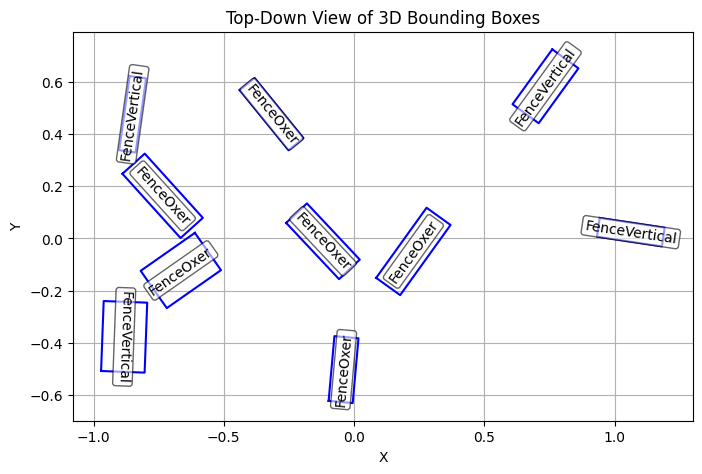

In [26]:
plot_top_down_bboxes(bbox_array, label_array)